In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('../funcs/')

In [125]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns
sns.set()

%matplotlib inline

import cufflinks as cf

import plotly.plotly as py

# Import modules to work with data visualizations offline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Connect to the plotly.js CDN with the init_notebook_mode() method
# so that the js code is fetched from a cdn, not saved into the notebook
init_notebook_mode(connected=True)

# Use cufflinks offline, don't push plots to the cloud
cf.go_offline()

import plotly.graph_objs as go

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

from data_processing import *
from ml import *

In [4]:
from sklearn.externals import joblib

In [13]:
df_gridsearch = pd.read_pickle('Models/dataframes cv/gridsearch_full_data_1dafter_3params_60h_df.pkl')

In [14]:
df_gridsearch.mean_fit_time.sum() / 60 / 60 / 4

60.195783570259806

In [15]:
df_gridsearch

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_min_samples_split,param_n_estimators,params,split0_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,mean_train_score,std_train_score,Text
0,48.881817,0.0,0.560996,0.0,0.05,2,10,"{'max_features': 0.05, 'min_samples_split': 2,...",0.857459,0.857459,0.000000e+00,960,0.970008,0.970008,0.0,max_features: 0.05<br>n_estimators: 10<br>min_...
1,49.794121,0.0,0.621840,0.0,0.05,2,13,"{'max_features': 0.05, 'min_samples_split': 2,...",0.860779,0.860779,0.000000e+00,907,0.970875,0.970875,0.0,max_features: 0.05<br>n_estimators: 13<br>min_...
2,67.388768,0.0,0.860470,0.0,0.05,2,18,"{'max_features': 0.05, 'min_samples_split': 2,...",0.863336,0.863336,0.000000e+00,882,0.972062,0.972062,0.0,max_features: 0.05<br>n_estimators: 18<br>min_...
3,81.765188,0.0,1.092893,0.0,0.05,2,25,"{'max_features': 0.05, 'min_samples_split': 2,...",0.861722,0.861722,0.000000e+00,898,0.973021,0.973021,0.0,max_features: 0.05<br>n_estimators: 25<br>min_...
4,117.491267,0.0,1.154067,0.0,0.05,2,33,"{'max_features': 0.05, 'min_samples_split': 2,...",0.863768,0.863768,0.000000e+00,875,0.973847,0.973847,0.0,max_features: 0.05<br>n_estimators: 33<br>min_...
5,148.469525,0.0,1.297910,0.0,0.05,2,45,"{'max_features': 0.05, 'min_samples_split': 2,...",0.865826,0.865826,0.000000e+00,853,0.973715,0.973715,0.0,max_features: 0.05<br>n_estimators: 45<br>min_...
6,207.374075,0.0,1.583611,0.0,0.05,2,60,"{'max_features': 0.05, 'min_samples_split': 2,...",0.873260,0.873260,1.110223e-16,763,0.973447,0.973447,0.0,max_features: 0.05<br>n_estimators: 60<br>min_...
7,274.467847,0.0,1.919202,0.0,0.05,2,81,"{'max_features': 0.05, 'min_samples_split': 2,...",0.874849,0.874849,0.000000e+00,729,0.974854,0.974854,0.0,max_features: 0.05<br>n_estimators: 81<br>min_...
8,359.365425,0.0,2.398840,0.0,0.05,2,110,"{'max_features': 0.05, 'min_samples_split': 2,...",0.874128,0.874128,0.000000e+00,739,0.975094,0.975094,0.0,max_features: 0.05<br>n_estimators: 110<br>min...
9,468.927653,0.0,2.520866,0.0,0.05,2,148,"{'max_features': 0.05, 'min_samples_split': 2,...",0.873435,0.873435,0.000000e+00,758,0.975540,0.975540,0.0,max_features: 0.05<br>n_estimators: 148<br>min...


In [16]:
3664 / 60

61.06666666666667

In [177]:
text_list = list(
    zip(
        'max_features: ' + df_gridsearch['param_max_features'].apply(str),
        'n_estimators: ' + df_gridsearch['param_n_estimators'].apply(str),
        'min_samples_split: ' + df_gridsearch['param_min_samples_split'].apply(str),
        'Test score: ' + df_gridsearch.mean_test_score.round(4).apply(str),
        'Train score: ' + df_gridsearch.mean_train_score.round(4).apply(str),
        'Training time: ' + (df_gridsearch.mean_fit_time // 60).astype('int').apply(str) + ' mins ' + \
            (df_gridsearch.mean_fit_time % 60).astype('int').apply(str) + ' s',
#         'Training time: ' + df_gridsearch.mean_fit_time.round(2).apply(str) + 's',
    )
)

text = ['<br>'.join(t) for t in text_list]

In [178]:
df_gridsearch['Text'] = text

##  Scatter3d all data

In [266]:
# Linear scale

trace = go.Scatter3d(
    x=df_gridsearch['param_max_features'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_test_score,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Test score'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='3D visualization of the grid search results',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='max_features',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
        ),
        zaxis = dict(
            title='min_samples_split',

        ),
    ),
 
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [180]:
# Log scale

trace = go.Scatter3d(
    x=df_gridsearch['param_max_features'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_test_score,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Test score'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='3D visualization of the grid search results',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='max_features',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='min_samples_split',
            type='log'
        ),
    ),
 
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Size by relative test score

In [181]:
df_gridsearch.mean_test_score.max()

0.912517308161964

In [182]:
df_gridsearch.mean_test_score.sort_values().reset_index(drop=True)

0       0.772652
1       0.783537
2       0.783729
3       0.792580
4       0.794095
5       0.795568
6       0.797843
7       0.799468
8       0.801341
9       0.803598
10      0.806206
11      0.806996
12      0.808334
13      0.810063
14      0.810379
15      0.810454
16      0.810597
17      0.811284
18      0.811324
19      0.811790
20      0.812537
21      0.813069
22      0.813754
23      0.814786
24      0.815347
25      0.815569
26      0.816206
27      0.816371
28      0.816992
29      0.817839
30      0.817940
31      0.818356
32      0.818367
33      0.818432
34      0.818763
35      0.819862
36      0.819977
37      0.820027
38      0.820098
39      0.820238
40      0.820270
41      0.820546
42      0.820883
43      0.820919
44      0.821130
45      0.821776
46      0.821965
47      0.822072
48      0.822094
49      0.822183
50      0.822419
51      0.822447
52      0.822479
53      0.822511
54      0.822683
55      0.823052
56      0.823260
57      0.823312
58      0.8233

In [183]:
df = pd.DataFrame(data=df_gridsearch.mean_test_score.sort_values().reset_index(drop=True))
df

,mean_test_score
0,0.772652
1,0.783537
2,0.783729
3,0.792580
4,0.794095
5,0.795568
6,0.797843
7,0.799468
8,0.801341
9,0.803598


In [267]:
df['size'] = (df.mean_test_score / df.mean_test_score.max()) ** 100 * 20 + 1

df.iplot(kind='scatter', 
         mode='lines',
         x='mean_test_score',
         size=5,
         xTitle='Mean test score',
         yTitle='Size',
         title='Size of the points as a function of the mean test score')

In [270]:
# Log scale

trace = go.Scatter3d(
    x=df_gridsearch['param_max_features'],
    y=df_gridsearch['param_n_estimators'],
    z=df_gridsearch['param_min_samples_split'],
    mode='markers', 
    marker=dict(
        size=(df_gridsearch.mean_test_score / df_gridsearch.mean_test_score.max()) ** 100 * 20 + 1,
#         size=df_gridsearch.mean_fit_time ** (1 / 3),
        color=df_gridsearch.mean_fit_time / 60,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Training time',
                      ticksuffix = ' mins'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)

data = [trace]
layout = go.Layout(
    title='3D visualization of the grid search results',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='max_features',
            nticks=10
        ),
        yaxis = dict(
            title='n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='min_samples_split',
            type='log'
        ),
    ),
 
)

fig = go.FigureWidget(data=data, layout=layout)
# fig
iplot(fig)
# py.iplot(fig)

### Add slider. Only works within jupyter notebook

In [24]:
# Log scales

from ipywidgets import interactive, HBox, VBox, widgets, interact

x=df_gridsearch['param_max_features']
y=df_gridsearch['param_n_estimators']
z=df_gridsearch['param_min_samples_split']

trace = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers', 
    marker=dict(
        size=df_gridsearch.mean_fit_time ** (1 / 3) * 1,
        color=df_gridsearch.mean_test_score,
        opacity=0.99,
        colorscale='Viridis',
        colorbar=dict(title = 'Test score'),
        line=dict(color='rgb(140, 140, 170)')
    ),
    text=df_gridsearch.Text,
    hoverinfo='text'
)



data = [trace]
layout = go.Layout(
    margin=dict(
        l=20,
        r=20,
        b=20,
        t=20
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='max_features',
            range=[x.min(), x.max()]
        ),
        yaxis = dict(
            title='n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='min_samples_split',
            type='log'

        ),
    ),
)

f = go.FigureWidget(data=data, layout=layout)


xmin, xmax = f['layout']['scene']['xaxis']['range']


slider = widgets.FloatRangeSlider(
    value=f.layout.scene.xaxis.range,
    min=xmin,
    max=xmax,
    step=(xmax - xmin) / 100.0,
#     readout=False,
    description='max_features')
slider.layout.width = '800px'

def update_range(y):
    f.layout.scene.xaxis.range = [y[0], y[1]]
    
    
# display the FigureWidget and slider with center justification
vb = VBox((interactive(update_range, y=slider), f, ))
vb.layout.align_items = 'center'
vb

## Heatmaps for max of test and train scores

In [245]:
max_scores = df_gridsearch.groupby(['param_min_samples_split',
                                    'param_max_features']).max().unstack()[['mean_test_score', 'mean_train_score']]
max_scores

mean_test_score                                \
param_max_features                 0.05      0.07      0.09      0.11   
param_min_samples_split                                                 
2                              0.874849  0.878947  0.887087  0.895174   
3                              0.874849  0.878947  0.887087  0.895174   
5                              0.874849  0.878947  0.887087  0.895174   
8                              0.874849  0.878947  0.887087  0.895174   
13                             0.868424  0.884465  0.895359  0.891123   
20                             0.867774  0.875453  0.881986  0.888127   
32                             0.859018  0.862322  0.881676  0.879641   
50                             0.847075  0.858827  0.862668  0.871906   
80                             0.836731  0.843662  0.860022  0.853257   
126                            0.821130  0.832779  0.843633  0.839728   
200                            0.810454  0.823388  0.832647  0.827216   

                                                                           \
param_max_features           0.13      0.15      0.17      0.19      0.21   
param_min_samples_split                                                     
2                        0.901097  0.895553  0.903603  0.902112  0.904296   
3                        0.901097  0.895553  0.903603  0.902112  0.904296   
5                        0.901097  0.895553  0.903603  0.902112  0.904296   
8                        0.901097  0.895553  0.903603  0.902112  0.904296   
13                       0.897312  0.895021  0.905736  0.900134  0.903567   
20                       0.889665  0.891855  0.902154  0.900174  0.900425   
32                       0.903424  0.885382  0.882762  0.889731  0.891780   
50                       0.869860  0.876154  0.883995  0.877267  0.883205   
80                       0.858722  0.859973  0.863575  0.877154  0.873812   
126                      0.846366  0.847376  0.847049  0.847670  0.848499   
200                      0.831212  0.835645  0.835937  0.840463  0.833107   

                                            mean_train_score            \
param_max_features           0.23      0.25             0.05      0.07   
param_min_samples_split                                                  
2                        0.907879  0.909908         0.975540  0.978600   
3                        0.907879  0.909908         0.975540  0.978600   
5                        0.907879  0.909908         0.975540  0.978600   
8                        0.907879  0.909908         0.975540  0.978600   
13                       0.904615  0.912517         0.972248  0.976081   
20                       0.896962  0.899431         0.968010  0.971397   
32                       0.893079  0.894114         0.958661  0.962730   
50                       0.882000  0.881941         0.937625  0.946623   
80                       0.866659  0.869044         0.912377  0.914212   
126                      0.849070  0.850844         0.875906  0.867752   
200                      0.835854  0.840912         0.840360  0.838573   

                                                                           \
param_max_features           0.09      0.11      0.13      0.15      0.17   
param_min_samples_split                                                     
2                        0.980067  0.981576  0.982303  0.982883  0.983473   
3                        0.980067  0.981576  0.982303  0.982883  0.983473   
5                        0.980067  0.981576  0.982303  0.982883  0.983473   
8                        0.980067  0.981576  0.982303  0.982883  0.983473   
13                       0.977646  0.979509  0.979876  0.980801  0.981303   
20                       0.973624  0.975380  0.975639  0.976234  0.977449   
32                       0.965870  0.969089  0.970616  0.970972  0.971576   
50                       0.945043  0.950945  0.951458  0.952079  0.952328   
80                       0.917204  0.9

In [246]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 6)


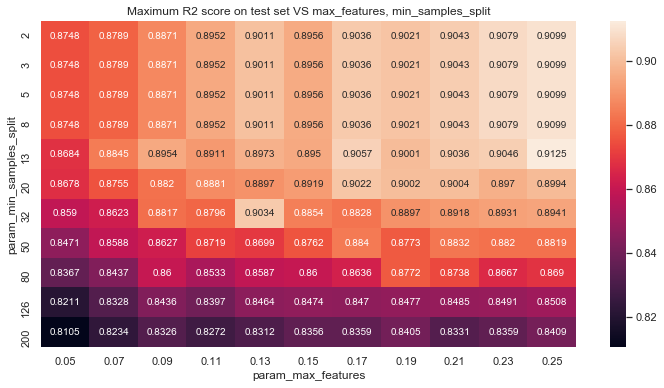

In [247]:
title = 'Maximum R2 score on test set VS max_features, min_samples_split'
fmt = 'png'
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g');
plt.title(title);
plt.savefig(f'Images/{title}.{fmt}', format=fmt, dpi=300);

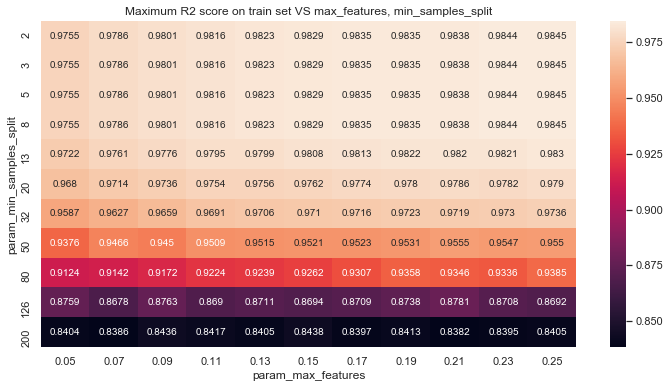

In [248]:
title = 'Maximum R2 score on train set VS max_features, min_samples_split'
fmt = 'png'
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g');
plt.title(title);
plt.savefig(f'Images/{title}.{fmt}', format=fmt, dpi=300)

In [249]:
max_scores = df_gridsearch.groupby(['param_min_samples_split',
                                    'param_n_estimators']).max().unstack()[['mean_test_score', 'mean_train_score']]
max_scores

mean_test_score                                \
param_n_estimators                  10        13        18        25    
param_min_samples_split                                                 
2                              0.904186  0.908998  0.904970  0.907456   
3                              0.904186  0.908998  0.904970  0.907456   
5                              0.904186  0.908998  0.904970  0.907456   
8                              0.904186  0.908998  0.904970  0.907456   
13                             0.905736  0.903649  0.906821  0.908657   
20                             0.898675  0.902154  0.894501  0.898331   
32                             0.903424  0.901429  0.894814  0.889866   
50                             0.880742  0.883995  0.880022  0.879044   
80                             0.877154  0.874837  0.867297  0.864297   
126                            0.844081  0.844801  0.846002  0.843919   
200                            0.836041  0.840463  0.833751  0.834380   

                                                                           \
param_n_estimators            33        45        60        81        110   
param_min_samples_split                                                     
2                        0.908743  0.908223  0.909908  0.909113  0.909690   
3                        0.908743  0.908223  0.909908  0.909113  0.909690   
5                        0.908743  0.908223  0.909908  0.909113  0.909690   
8                        0.908743  0.908223  0.909908  0.909113  0.909690   
13                       0.912078  0.912517  0.910711  0.909805  0.910383   
20                       0.898626  0.897985  0.898894  0.897676  0.898644   
32                       0.890933  0.891756  0.889806  0.890207  0.892668   
50                       0.883086  0.881920  0.879431  0.879590  0.881700   
80                       0.866823  0.869355  0.869044  0.866767  0.867204   
126                      0.846720  0.850844  0.849683  0.850090  0.848180   
200                      0.835548  0.835600  0.836779  0.840912  0.838915   

                                            mean_train_score            \
param_n_estimators            148       200              10        13    
param_min_samples_split                                                  
2                        0.908594  0.908326         0.980678  0.981432   
3                        0.908594  0.908326         0.980678  0.981432   
5                        0.908594  0.908326         0.980678  0.981432   
8                        0.908594  0.908326         0.980678  0.981432   
13                       0.908948  0.908208         0.980045  0.980998   
20                       0.900425  0.900174         0.974166  0.974469   
32                       0.893953  0.894114         0.970786  0.970263   
50                       0.881941  0.881457         0.949987  0.953383   
80                       0.865787  0.866459         0.930779  0.931430   
126                      0.848229  0.849470         0.869793  0.875906   
200                      0.838496  0.838324         0.829320  0.841743   

                                                                           \
param_n_estimators            18        25        33        45        60    
param_min_samples_split                                                     
2                        0.981705  0.983491  0.984114  0.983891  0.983390   
3                        0.981705  0.983491  0.984114  0.983891  0.983390   
5                        0.981705  0.983491  0.984114  0.983891  0.983390   
8                        0.981705  0.983491  0.984114  0.983891  0.983390   
13                       0.980938  0.982590  0.982996  0.982378  0.981905   
20                       0.976219  0.977793  0.977790  0.977610  0.977496   
32                       0.971373  0.972633  0.972628  0.972753  0.973075   
50                       0.951789  0.951375  0.952275  0.951382  0.951126   
80                       0.931757  0.9

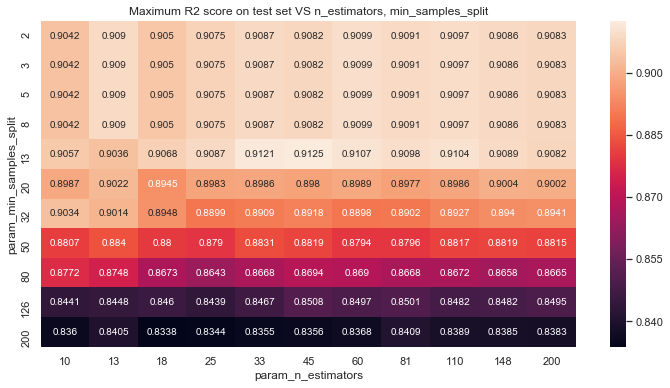

In [250]:
title = 'Maximum R2 score on test set VS n_estimators, min_samples_split'
fmt = 'png'
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g');
plt.title(title);
plt.savefig(f'Images/{title}.{fmt}', format=fmt, dpi=300)

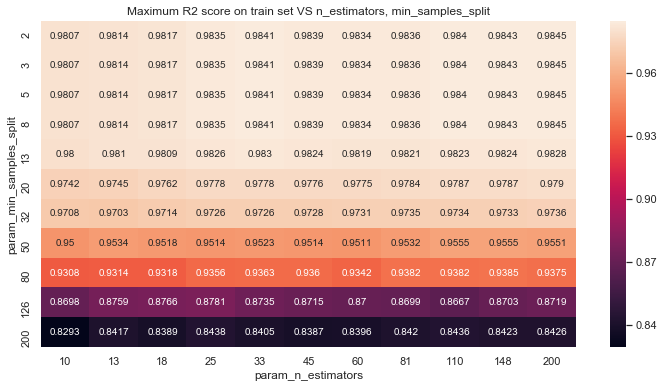

In [252]:
title = 'Maximum R2 score on train set VS n_estimators, min_samples_split'
fmt = 'jpg'
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g');
plt.title(title);
plt.savefig(f'Images/{title}.{fmt}', format=fmt, dpi=300)

In [252]:
max_scores = df_gridsearch.groupby(['param_n_estimators',
                                    'param_max_features']).max().unstack()[['mean_test_score', 'mean_train_score']]
max_scores

mean_test_score                                          \
param_max_features            0.05      0.07      0.09      0.11      0.13   
param_n_estimators                                                           
10                        0.857459  0.884465  0.895359  0.887817  0.903424   
13                        0.860779  0.870456  0.894658  0.887426  0.901429   
18                        0.864139  0.868605  0.882739  0.883924  0.896616   
25                        0.861722  0.877345  0.890112  0.886628  0.897394   
33                        0.863768  0.879153  0.888407  0.891868  0.896841   
45                        0.865826  0.877996  0.887705  0.894132  0.897950   
60                        0.873260  0.877470  0.886791  0.895174  0.898153   
81                        0.874849  0.873927  0.885843  0.893850  0.896557   
110                       0.874128  0.874360  0.885817  0.892145  0.896381   
148                       0.873435  0.878947  0.886109  0.894653  0.896099   
200                       0.873816  0.877249  0.886051  0.894710  0.897941   

                                                                      \
param_max_features      0.15      0.17      0.19      0.21      0.23   
param_n_estimators                                                     
10                  0.886879  0.905736  0.887846  0.895790  0.901665   
13                  0.885147  0.903193  0.894853  0.903877  0.904313   
18                  0.886061  0.893876  0.891201  0.897759  0.899716   
25                  0.884874  0.893453  0.896917  0.901533  0.901352   
33                  0.891855  0.899480  0.893900  0.901300  0.904615   
45                  0.893590  0.902741  0.897374  0.902565  0.902277   
60                  0.893561  0.903075  0.898565  0.904139  0.903938   
81                  0.895132  0.903603  0.900134  0.903441  0.903668   
110                 0.893715  0.899887  0.902112  0.903694  0.906772   
148                 0.895138  0.899851  0.901434  0.903661  0.906400   
200                 0.895553  0.900048  0.900174  0.904296  0.907879   

                             mean_train_score                                \
param_max_features      0.25             0.05      0.07      0.09      0.11   
param_n_estimators                                                            
10                  0.904186         0.970008  0.973006  0.974606  0.977310   
13                  0.908998         0.970875  0.974990  0.975901  0.977632   
18                  0.906821         0.972062  0.976638  0.976901  0.978254   
25                  0.908657         0.973021  0.977928  0.978154  0.980020   
33                  0.912078         0.973847  0.978235  0.978343  0.980915   
45                  0.912517         0.973715  0.977344  0.978320  0.980515   
60                  0.910711         0.973447  0.977421  0.978196  0.980123   
81                  0.909805         0.974854  0.978600  0.979112  0.981010   
110                 0.910383         0.975094  0.978374  0.979409  0.981051   
148                 0.908948         0.975540  0.978495  0.979713  0.981385   
200                 0.908326         0.975424  0.978530  0.980067  0.981576   

                                                                      \
param_max_features      0.13      0.15      0.17      0.19      0.21   
param_n_estimators                                                     
10                  0.976896  0.978229  0.978127  0.978510  0.979978   
13                  0.978214  0.979516  0.980054  0.979683  0.980855   
18                  0.979443  0.980203  0.981318  0.980581  0.980505   
25                  0.980022  0.981474  0.982538  0.981593  0.981711   
33                  0.980692  0.982060  0.982251  0.982156  0.982239   
45                  0.980944  0.981618  0.982273  0.981388  0.982067   
60                  0.981255  0.981798  0.982258  0.981087  0.981872   
81                  0.981791  0.982681  0.982806  0.982079  0.983054   
110               

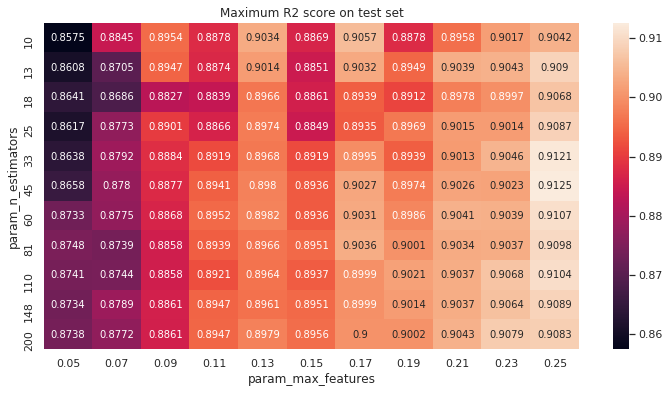

In [253]:
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g');
plt.title('Maximum R2 score on test set');

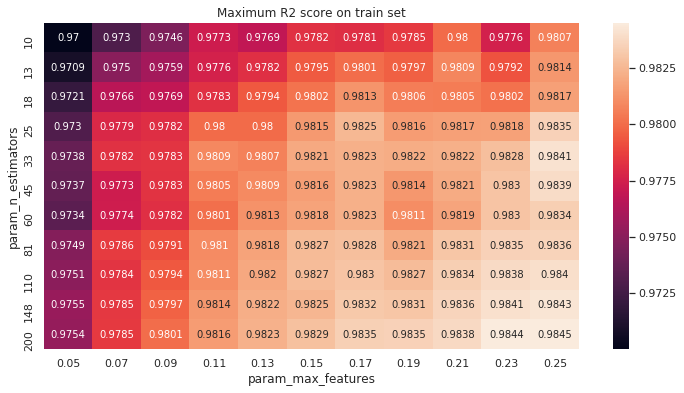

In [254]:
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g');
plt.title('Maximum R2 score on train set');

## Scatter3d

In [192]:
# Log scale

min_samples_split = 13

filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==min_samples_split]

# test = go.Scatter3d(
#     x=filtered_df['param_max_features'],
#     y=filtered_df['param_n_estimators'],
#     z=filtered_df['mean_test_score'],
#     mode='markers', 
#     marker=dict(
#         size=filtered_df.mean_fit_time ** (1 / 3),
#         color=filtered_df.mean_test_score,
#         opacity=0.99,
#         colorscale='Viridis',
#         colorbar=dict(title = 'Test score'),
#         line=dict(color='rgb(140, 140, 170)')
#     ),
#     text=filtered_df.Text,
#     hoverinfo='text+name',
#     name='Test set'
# )

# train = go.Scatter3d(
#     x=filtered_df['param_max_features'],
#     y=filtered_df['param_n_estimators'],
#     z=filtered_df['mean_train_score'],
#     mode='markers', 
#     marker=dict(
#         size=filtered_df.mean_fit_time ** (1 / 3),
#         color=filtered_df.mean_train_score,
#         opacity=0.99,
#         colorscale='Viridis',
#         colorbar=dict(title = 'Train score'),
#         line=dict(color='rgb(140, 140, 170)')

#     ),
#     text=filtered_df.Text,
#     hoverinfo='text+name',
#     name='Train set'
# )

# data = [test, train]

data = [
        go.Scatter3d(
            x=filtered_df['param_max_features'],
            y=filtered_df['param_n_estimators'],
            z=filtered_df[f'mean_{set_name}_score'],
            mode='markers', 
            marker=dict(
                size=filtered_df.mean_fit_time ** (1 / 3),
                color=filtered_df[f'mean_{set_name}_score'],
                opacity=0.99,
                colorscale='Viridis',
                colorbar=dict(title = f'{set_name.capitalize()} score'),
                line=dict(color='rgb(140, 140, 170)'),
                showscale=False,

            ),
            text=filtered_df.Text,
            hoverinfo='text+name',
            name=f'{set_name.capitalize()} set',
        )
    
    for set_name in ['train', 'test']
]
layout = go.Layout(
    margin=dict(
        l=20,
        r=20,
        b=20,
        t=20
    ),
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='max_features',
        ),
        yaxis = dict(
            title='n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='R2 score',
            type='log'
        ),
        camera = dict(
            eye = dict(
                y = 2.089757339892154,
                x = -0.5464711077183096,
                z = 0.14759264478960377,
                )
            ),
    ),
 
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

## Surface plots

In [193]:
min_samples_split = 13

filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==min_samples_split]

scores = filtered_df.pivot('param_n_estimators', 'param_max_features',)

In [194]:
scores.mean_train_score

param_max_features,0.05,0.07,0.09,0.11,0.13,0.15,0.17,0.19,0.21,0.23,0.25
param_n_estimators,,,,,,,,,,,
10,0.966807,0.971529,0.973144,0.975758,0.976121,0.977220,0.976470,0.978339,0.978201,0.976881,0.980045
13,0.969806,0.972696,0.973725,0.976048,0.976095,0.978336,0.977161,0.979683,0.979435,0.979212,0.980998
18,0.970552,0.972795,0.974767,0.976659,0.976586,0.979115,0.977917,0.980581,0.979625,0.979871,0.980938
25,0.970911,0.974579,0.976615,0.977383,0.978712,0.979964,0.979172,0.981593,0.981149,0.981399,0.982590
33,0.972090,0.974835,0.977248,0.978780,0.979074,0.979668,0.979951,0.982156,0.981720,0.981544,0.982996
45,0.970961,0.974437,0.976298,0.977770,0.978425,0.979316,0.979957,0.981388,0.980988,0.980857,0.982378
60,0.970846,0.974340,0.976379,0.978130,0.978571,0.979000,0.980356,0.981018,0.980702,0.980833,0.981905
81,0.971820,0.975668,0.977260,0.979198,0.979326,0.980354,0.981179,0.981447,0.981448,0.981603,0.982066
110,0.972047,0.975925,0.977646,0.979509,0.979485,0.980542,0.981303,0.981683,0.981746,0.981634,0.982300


In [195]:
data = [
    go.Surface(z=scores[f'mean_{set_name}_score'].values, 
               x=scores[f'mean_{set_name}_score'].columns,
               y=scores.index,
               colorscale='Viridis',
               showscale=False,
               hoverinfo='text+name',
               text=scores.Text.values,
               name=f'{set_name.capitalize()} set',
              )
    for set_name in ['train', 'test']
]

layout = go.Layout(
    title='R2 scores VS n_estimators and max_features',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
    showlegend=True,
#     height=600,
#     width=960,
    scene = dict(
        xaxis = dict(
            title='param_max_features',
        ),
        yaxis = dict(
            title='param_n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='R2 Score',
        ),
        aspectratio = dict(
            x = 1,
            y = 1,
            z = 1
        ),
        camera = dict(
            eye = dict(
                y = 2.089757339892154,
                x = -0.5464711077183096,
                z = 0.14759264478960377,
            )
        ),
    ),
)


fig = go.Figure(data=data, layout=layout)
iplot(fig)
# fig = go.FigureWidget(data=data, layout=layout)
# fig

# Slider

## Animated

Inspired by https://plot.ly/python/gapminder-example/

In [196]:
fig.layout

Layout({
    'margin': {'b': 30, 'l': 30, 'r': 30, 't': 30},
    'scene': {'aspectratio': {'x': 1, 'y': 1, 'z': 1},
              'camera': {'eye': {'x': -0.5464711077183096, 'y': 2.089757339892154, 'z': 0.14759264478960377}},
              'xaxis': {'title': 'param_max_features'},
              'yaxis': {'title': 'param_n_estimators', 'type': 'log'},
              'zaxis': {'title': 'R2 Score'}},
    'showlegend': True,
    'title': 'R2 scores VS n_estimators and max_features'
})

In [197]:
# make list of min_samples_split

min_samples_split_list = list(set(df_gridsearch.param_min_samples_split))
min_samples_split_list.sort()


# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

# layout

figure['layout'] = go.Layout({
#     'height': 600,
    'margin': {'b': 20, 'l': 20, 'r': 20, 't': 20},
    'scene': {'camera': {'eye': {'x': -0.5464711077183096, 'y': 2.089757339892154, 'z': 0.14759264478960377}},
              'xaxis': {'title': 'max_features'},
              'yaxis': {'title': 'n_estimators', 'type': 'log'},
              'zaxis': {'title': 'R2 score', 'range': [0.78, 1]},
              'aspectratio': {'x': 1, 'y': 1, 'z': 1}
             },
#     'width': 960
})

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]


sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'min_samples_split:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.8,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
n = 2
filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==n]
data = [
        go.Scatter3d(
            x=filtered_df['param_max_features'],
            y=filtered_df['param_n_estimators'],
            z=filtered_df[f'mean_{set_name}_score'],
            mode='markers', 
            marker=dict(
                size=filtered_df.mean_fit_time ** (1 / 3),
                color=filtered_df[f'mean_{set_name}_score'],
                opacity=0.99,
                colorscale='Viridis',
                colorbar=dict(title = f'{set_name.capitalize()} score'),
                line=dict(color='rgb(140, 140, 170)'),
                showscale=False,

            ),
            text=filtered_df.Text,
            hoverinfo='text+name',
            name=f'{set_name.capitalize()} set',
        )
    
    for set_name in ['train', 'test']
]

figure['data'] = data


# make frames

for n in min_samples_split_list:
    frame = {'data': [], 'name': str(n)}
    
    filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==n]
    data = [
            go.Scatter3d(
                x=filtered_df['param_max_features'],
                y=filtered_df['param_n_estimators'],
                z=filtered_df[f'mean_{set_name}_score'],
                mode='markers', 
                marker=dict(
                    size=filtered_df.mean_fit_time ** (1 / 3),
                    color=filtered_df[f'mean_{set_name}_score'],
                    opacity=0.99,
                    colorscale='Viridis',
                    colorbar=dict(title = f'{set_name.capitalize()} score'),
                    line=dict(color='rgb(140, 140, 170)'),
                    showscale=False,

                ),
                text=filtered_df.Text,
                hoverinfo='text+name',
                name=f'{set_name.capitalize()} set',
            )

        for set_name in ['train', 'test']
    ]
    frame['data'] = data
    
    figure['frames'].append(frame)
    slider_step = {
        'args': [
            [n],
            {'frame': {'duration': 300, 
                       'redraw': True},
             'mode': 'immediate',
             'transition': {'duration': 300}}
        ],
        'label': str(n),
        'method': 'animate'
    }
    sliders_dict['steps'].append(slider_step)

In [198]:
figure['layout']['sliders'] = [sliders_dict]

iplot(figure)


In [199]:
len(figure['data'])

2

## Simple slider

Inspired by https://plot.ly/~jackp/17248/sliders-in-python/#/

In [200]:
data = []
for n in min_samples_split_list:
    filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==n]
    scores = filtered_df.pivot('param_n_estimators', 'param_max_features',)
    traces = [
        go.Surface(z=scores[f'mean_{set_name}_score'].values, 
                   x=scores[f'mean_{set_name}_score'].columns,
                   y=scores.index,
                   colorscale='Viridis',
                   showscale=False,
                   hoverinfo='text+name',
                   text=scores.Text.values,
                   name=f'{set_name.capitalize()} set',
                   visible=False,
                  )
        for set_name in ['train', 'test']
    ]
    data.append(traces[0])
    data.append(traces[1])
    
    
data[8].visible = True
data[9].visible = True



In [201]:
steps = []
for i, n in enumerate(min_samples_split_list):
    step = dict(
        method='restyle',
        args = ['visible', [False] * len(data) * 2]
    )
    step['args'][1][i*2] = True # toggle i'th traces to 'visible'
    step['args'][1][i*2+1] = True # toggle i'th traces to 'visible'
    step['label'] = str(n)
    steps.append(step)

In [202]:
sliders = [dict(
    active = 4,
    currentvalue = {"prefix": "min_samples_split: "},
    pad = {"t": 10, 'b': 20},
    steps = steps,
    len=.5,
    xanchor = 'center',
    x = 0.5
)]

In [203]:
layout = go.Layout(
    title='R2 scores VS n_estimators and max_features',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    sliders = sliders,
    scene = dict(
        xaxis = dict(
            title='param_max_features',
            nticks=5
        ),
        yaxis = dict(
            title='param_n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='R2 Score',
            range=[0.751, 1],
            nticks=5
        ),
        aspectratio = dict(
            x = 1,
            y = 1,
            z = 1
        ),
        camera = dict(
            eye = dict(
                y = 2.089757339892154,
                x = -0.5464711077183096,
                z = 0.14759264478960377,
            )
        ),
    ),
)


fig = go.Figure(data=data, layout=layout)
iplot(fig)
# fig = go.FigureWidget(data=data, layout=layout)
# fig

### Add slider to Scatter3d plots

In [204]:
data = []
for n in min_samples_split_list:
    filtered_df = df_gridsearch[df_gridsearch.param_min_samples_split==n]
    traces = [
        go.Scatter3d(
            x=filtered_df['param_max_features'],
            y=filtered_df['param_n_estimators'],
            z=filtered_df[f'mean_{set_name}_score'],
            mode='markers', 
            marker=dict(
                size=filtered_df.mean_fit_time ** (1 / 3),
                color=filtered_df[f'mean_{set_name}_score'],
                opacity=0.99,
                colorscale='Viridis',
                colorbar=dict(title = f'{set_name.capitalize()} score'),
                line=dict(color='rgb(140, 140, 170)'),
                showscale=False,

            ),
            text=filtered_df.Text,
            hoverinfo='text+name',
            name=f'{set_name.capitalize()} set',
            visible=False,
        )
        for set_name in ['train', 'test']
    ]
    
    data.append(traces[0])
    data.append(traces[1])
    
    
data[8].visible = True
data[9].visible = True



In [205]:
steps = []
for i, n in enumerate(min_samples_split_list):
    step = dict(
        method='restyle',
        args = ['visible', [False] * len(data) * 2]
    )
    step['args'][1][i*2] = True # toggle i'th traces to 'visible'
    step['args'][1][i*2+1] = True # toggle i'th traces to 'visible'
    step['label'] = str(n)
    steps.append(step)

In [206]:
sliders = [dict(
    active = 4,
    currentvalue = {"prefix": "min_samples_split: "},
    pad = {"t": 10, 'b': 20},
    steps = steps,
    len=.5,
    xanchor = 'center',
    x = 0.5
)]

In [207]:
layout = go.Layout(
    title='R2 scores VS n_estimators and max_features',
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30
    ),
#     height=600,
#     width=960,
    sliders = sliders,
        scene = dict(
        xaxis = dict(
            title='param_max_features',
            nticks=5
        ),
        yaxis = dict(
            title='param_n_estimators',
            type='log'
        ),
        zaxis = dict(
            title='R2 Score',
            range=[0.751, 1],
            nticks=5
        ),
#         aspectratio = dict(
#             x = 1.3,
#             y = 1.3,
#             z = .9
#         ),
        aspectratio = dict(
            x = 1,
            y = 1,
            z = 1,
        ),
        camera = dict(
            eye = dict(
                y = 2.089757339892154,
                x = -0.5464711077183096,
                z = 0.14759264478960377,
            )
        ),
    ),
)


fig = go.Figure(data=data, layout=layout)
iplot(fig)
# fig = go.FigureWidget(data=data, layout=layout)
# fig